## Import libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots
import datetime as dt

import spacy
from wordcloud import WordCloud

# modeling
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, precision_score

import statsmodels.tsa.api as smt
import statsmodels.api as sm

2023-06-14 16:47:58.169277: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-14 16:47:58.320403: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-14 16:47:58.938232: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-06-14 16:47:58.938340: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] 

## Import Data

In [2]:
#Import base
stock_prices = pd.read_csv('../data/merged_df.csv')
stock_prices = stock_prices.drop(['Unnamed: 0'],axis=1)
stock_prices

,Date,Open,High,Low,Close,Adj Close,Volume,Ticker,Instrument,eps_mean,eps_mean_report,eps_mean_report_ps,sp_500_closeprice,symbol,quarter,year,earning_call_date,content
0,2013-02-01,36.840000,37.200001,36.520000,37.180000,24.526785,9527500.0,ABBV,NaN,NaN,NaN,NaN,151.240005,NaN,NaN,NaN,NaN,NaN
1,2013-02-04,36.639999,37.299999,36.549999,37.279999,24.592743,6348000.0,ABBV,NaN,NaN,NaN,NaN,149.539993,NaN,NaN,NaN,NaN,NaN
2,2013-02-05,37.419998,37.730000,37.180000,37.200001,24.539970,7284400.0,ABBV,NaN,NaN,NaN,NaN,151.050003,NaN,NaN,NaN,NaN,NaN
3,2013-02-06,36.959999,37.279999,36.860001,37.139999,24.500391,5738900.0,ABBV,NaN,NaN,NaN,NaN,151.160004,NaN,NaN,NaN,NaN,NaN
4,2013-02-07,37.570000,37.570000,35.799999,36.419998,24.025429,9872500.0,ABBV,ABBV,3.1,2.9,NaN,150.960007,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44192,2014-11-09,NaN,NaN,NaN,NaN,73.500000,2606900.0,AZN,NaN,NaN,NaN,NaN,NaN,AZN,3.0,2014.0,2014-11-09,"Pascal Soriot: Good afternoon, and thank you f..."
44193,2015-02-07,NaN,NaN,NaN,NaN,73.500000,2606900.0,AZN,NaN,NaN,NaN,NaN,NaN,AZN,4.0,2014.0,2015-02-07,"Pascal Soriot: All right. Good afternoon, ever..."
44194,2016-07-31,NaN,NaN,NaN,NaN,73.500000,2606900.0,AZN,NaN,NaN,NaN,NaN,NaN,AZN,2.0,2016.0,2016-07-31,"Pascal Soriot: Hello, everyone. I am Pascal So..."
44195,2018-05-19,NaN,NaN,NaN,NaN,73.500000,2606900.0,AZN,NaN,NaN,NaN,NaN,NaN,AZN,1.0,2018.0,2018-05-19,Operator: Good morning and good afternoon. Wel...


## Feature Creation

### Close price percentual (future and past) - 10 days

In [3]:
# 10d past return %
stock_prices['10d_close_pct'] = stock_prices['Adj Close'].pct_change(5)

# 10d future return %
stock_prices['10d_future_close'] = stock_prices['Adj Close'].shift(-5)
stock_prices['10d_future_close_pct'] = (stock_prices['10d_future_close'] / stock_prices['Adj Close']).pow(1/5) - 1

# Moving averages for different time windows
time_periods = [5, 14, 50, 200]
for n in time_periods:
    stock_prices[f'ma{n}'] = stock_prices['Adj Close'].rolling(window=n).mean()

# Relative Strength Index (RSI) for different time windows
for n in time_periods:
    delta = stock_prices['Adj Close'].diff()
    gains = delta.mask(delta < 0, 0)
    losses = -delta.mask(delta > 0, -0)
    avg_gain = gains.rolling(window=n).mean()
    avg_loss = losses.rolling(window=n).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    stock_prices[f'rsi{n}'] = rsi

### Porcentual difference betweeen movement variables

+ Create porcentual difference between recent movement variables
  + 1 week
  + 1 month
  + 1 quarter
  + 1 year

In [4]:
#Create variables 

stock_prices['1_week_val'] = stock_prices.groupby('Ticker')['Adj Close'].shift(5)
stock_prices['1_month_val'] = stock_prices.groupby('Ticker')['Adj Close'].shift(20)
stock_prices['1_quarter_val']=stock_prices.groupby('Ticker')['Adj Close'].shift(60)
stock_prices['1_year_val']=stock_prices.groupby('Ticker')['Adj Close'].shift(252)


#Difference between variables and Adj Close prices of day

stock_prices['por_change_1_week_val'] = (stock_prices['Adj Close'] - stock_prices['1_week_val'])*100/stock_prices['1_week_val']
stock_prices['por_change_1_month_val'] = (stock_prices['Adj Close'] - stock_prices['1_month_val'])*100/stock_prices['1_month_val']
stock_prices['por_change_1_quater_val'] = (stock_prices['Adj Close'] - stock_prices['1_quarter_val'])*100/stock_prices['1_quarter_val']
stock_prices['por_change_1_year_val'] = (stock_prices['Adj Close'] - stock_prices['1_year_val'])*100/stock_prices['1_year_val']


#Drop variables

stock_prices = stock_prices.drop(['1_week_val','1_month_val','1_quarter_val','1_year_val'], axis = 1)

### Moving average mean variables

+ Create moving average mean variables

In [5]:
stock_prices['5_day_ma'] = stock_prices.groupby('Ticker')['Adj Close'].rolling(window=5).mean().reset_index(0, drop=True) # 5 days moving average grouped by Ticker
stock_prices['10_day_ma'] = stock_prices.groupby('Ticker')['Adj Close'].rolling(window=10).mean().reset_index(0, drop=True) # 10 days moving average grouped by Ticker
stock_prices['20_day_ma'] = stock_prices.groupby('Ticker')['Adj Close'].rolling(window=20).mean().reset_index(0, drop=True) # 20 days moving average grouped by Ticker

# calculate prev Adj Close and 3day Adj Close by grouping on 'ticker'
stock_prices['ma_30day'] = stock_prices.groupby('Ticker')['5_day_ma'].shift(20)
stock_prices['ma_90day'] = stock_prices.groupby('Ticker')['10_day_ma'].shift(60)
stock_prices['ma_1year']=stock_prices.groupby('Ticker')['20_day_ma'].shift(252)

stock_prices['ma_5days_1month'] = (stock_prices['Adj Close'] - stock_prices['ma_30day'])*100/stock_prices['ma_30day']
stock_prices['ma_10days_1quarter'] = (stock_prices['Adj Close'] - stock_prices['ma_90day'])*100/stock_prices['ma_90day']
stock_prices['ma_20days_1year'] = (stock_prices['Adj Close'] - stock_prices['ma_1year'])*100/stock_prices['ma_1year']

#Drop variables 

stock_prices = stock_prices.drop(['5_day_ma','10_day_ma','20_day_ma','ma_30day','ma_90day','ma_1year'], axis = 1)


#### EPS construction
 + Construction of EPS according to closest day of the earning call
 + We check a 10 day window (before and after the earning call)

In [6]:
window_size = 5

for i in range(1, window_size+1):
    col_suffix = f'_{i}day'

    # Create eps_mean_report columns
    stock_prices[f'eps_mean_report{col_suffix}'] = stock_prices.groupby('Ticker')['eps_mean_report'].shift(i)
    stock_prices[f'eps_mean_report{col_suffix}_a'] = stock_prices.groupby('Ticker')['eps_mean_report'].shift(-i)

    # Replace missing values in the desired order
    stock_prices.loc[stock_prices['eps_mean_report'].isna(), 'eps_mean_report'] = stock_prices.loc[stock_prices['eps_mean_report'].isna(), f'eps_mean_report{col_suffix}']
    stock_prices.loc[stock_prices['eps_mean_report'].isna(), 'eps_mean_report'] = stock_prices.loc[stock_prices['eps_mean_report'].isna(), f'eps_mean_report{col_suffix}_a']

    # Create eps_mean columns
    stock_prices[f'eps_mean{col_suffix}'] = stock_prices.groupby('Ticker')['eps_mean'].shift(i)
    stock_prices[f'eps_mean{col_suffix}_a'] = stock_prices.groupby('Ticker')['eps_mean'].shift(-i)

    # Replace missing values in the desired order
    stock_prices.loc[stock_prices['eps_mean'].isna(), 'eps_mean'] = stock_prices.loc[stock_prices['eps_mean'].isna(), f'eps_mean{col_suffix}']
    stock_prices.loc[stock_prices['eps_mean'].isna(), 'eps_mean'] = stock_prices.loc[stock_prices['eps_mean'].isna(), f'eps_mean{col_suffix}_a']

# Drop unnecessary columns
drop_cols = [f'eps_mean_report_{i}day' for i in range(1, window_size+1)] + \
            [f'eps_mean_report_{i}day_a' for i in range(1, window_size+1)] + \
            [f'eps_mean_{i}day' for i in range(1, window_size+1)] + \
            [f'eps_mean_{i}day_a' for i in range(1, window_size+1)]
stock_prices = stock_prices.drop(drop_cols, axis=1)


+ Differences with expected EPS

In [7]:
stock_prices['eps_mean_report_pdif']  =  (stock_prices['eps_mean_report'] - stock_prices['eps_mean'])*100/stock_prices['eps_mean']

## Data exploration

In [8]:
stock_prices = stock_prices.sort_values(by=['Ticker', 'Date'])

+ Distribution of stock prices

In [9]:
temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), width=800))
train_date = stock_prices.Date.unique()
close_avg = stock_prices.groupby(['Date', 'Ticker'])['Close'].mean().rename('Closing Price')
close_avg = close_avg.unstack(level='Ticker') # Add multi-index
vol_avg = stock_prices.groupby(['Date', 'Ticker'])['Volume'].mean().rename('Volume')
vol_avg = vol_avg.unstack(level='Ticker') # Add multi-index
# Define color scale for ticker categories
color_scale = px.colors.qualitative.Dark24[:len(close_avg.columns)]
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)
# Create a trace for each ticker in close_avg and vol_avg
for i, (df, title) in enumerate([(close_avg, 'Closing Price'), (vol_avg, 'Shares Traded')]):
    fig.add_trace(go.Scatter(x=train_date, y=df.iloc[:,0], mode='lines',
                             name=df.columns[0], line_color=color_scale[0]), row=i+1, col=1)
    
    for j, ticker in enumerate(df.columns[1:], 1):
        fig.add_trace(go.Scatter(x=train_date, y=df[ticker], mode='lines',
                                 name=ticker, line_color=color_scale[j]), row=i+1, col=1)
fig.update_xaxes(rangeslider_visible=False,
                 rangeselector=dict(
                     buttons=list([
                         dict(count=6, label="6m", step="month", stepmode="backward"),
                         dict(count=1, label="1y", step="year", stepmode="backward"),
                         dict(count=2, label="2y", step="year", stepmode="backward"),
                         dict(step="all")])),
                 row=1,col=1)
fig.update_layout(template=temp,title='Closing Price and Shares Traded', 
                  hovermode='x unified', height=700, xaxis2_title = 'Year',
                  yaxis1_title='Closing Price', yaxis2_title='Shares Traded',
                  showlegend=True)
# Add color scale legend
for i, ticker in enumerate(close_avg.columns):
    fig.add_trace(go.Scatter(x=[None], y=[None], mode='lines',
                             name=ticker, line_color=color_scale[i]), row=1, col=1)
fig.update_layout(legend=dict(y=1.1, traceorder='reversed'))
    
fig.show()

+ Close price distribution

In [10]:
px.box(stock_prices, x='Ticker', y='Close',title = 'Close price distribution by ticker').update_layout(title_x = 0.5,xaxis_title= 'Ticker name', yaxis_title="Closing price of the stock")

+ Earnings calls distribution

In [11]:
#Pyplot
fig = px.histogram(data_frame = stock_prices,x = 'Ticker',color_discrete_sequence=['indianred'],title = 'Age Frecuency').update_layout(
    title={"text": "Distribution of the earning calls by ticker name age", "x": 0.5}, yaxis_title="Frecuency", bargap = 0.1).update_xaxes(categoryorder = "total descending")
fig.show()

+ Distribution of the calls

In [12]:
#Pyplot
fig = px.histogram(data_frame = stock_prices,x = 'year',color_discrete_sequence=['indianred'],title = 'Age Frecuency').update_layout(
    title={"text": "Distribution of the earning calls per age", "x": 0.5}, yaxis_title="Frecuency", bargap = 0.1)
fig.show()

+ Worldcloud

In [13]:
nlp = spacy.load("en_core_web_sm", exclude=["ner"])

def spacy_tokenizer(texts, nlp=nlp):
  """
  Objective: get the tokenizer you want, and quit stop words
  inputs: 
    - nlp, spacy model: the spacy model to consider
    - texts, list of texts: the list of texts to tokenize
    - stop_words, list of stop_words to avoid
  outputs: 
    - tokens, list of lists of tokens: the list of all sentences tokenized
  """
  docs = nlp.pipe(texts)
  tokens = []
  for doc in tqdm(docs, total=len(texts)):
    _tokens = [tok.text.lower() for tok in doc 
               if tok.pos_ in ['ADJ', 'ADV']]
    tokens.append(_tokens)
  return tokens

In [14]:
earnings_callsa = stock_prices.copy()
earnings_calls = earnings_callsa.filter(['earning_call_date','content'], axis=1)
earnings_calls = earnings_calls.dropna(subset=['earning_call_date'])
earnings_calls['content'] = earnings_calls['content'].astype(str)

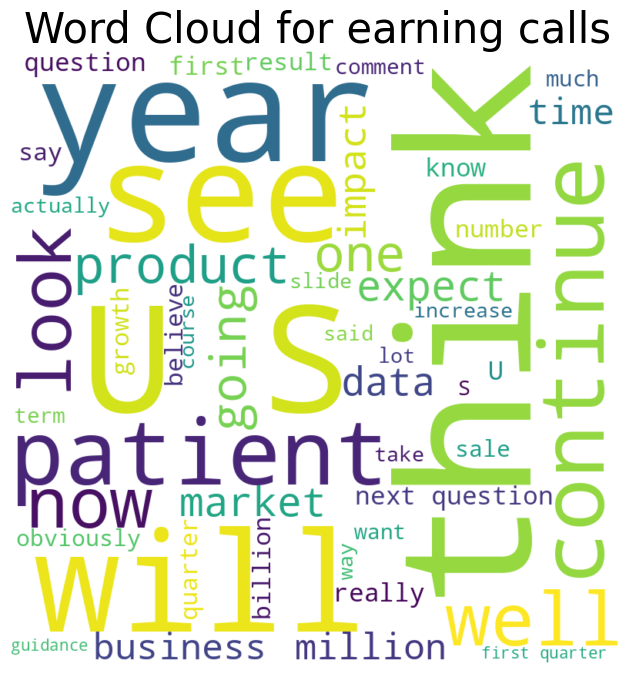

In [15]:
wordcloud = WordCloud(width=800, height=800, background_color='white', colormap='viridis', max_words=50)

wordcloud_title = ' '.join(earnings_calls['content'])
wordcloud.generate(wordcloud_title)
# Plot the word cloud with a title
plt.figure(figsize=(8,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for earning calls', fontsize=30)
plt.show()

## Novartis exploration

In [16]:
nvs = stock_prices[stock_prices['Ticker']=="NVS"]
nvs.reset_index(inplace=True)
nvs.head()

,index,Date,Open,High,Low,Close,Adj Close,Volume,Ticker,Instrument,...,rsi50,rsi200,por_change_1_week_val,por_change_1_month_val,por_change_1_quater_val,por_change_1_year_val,ma_5days_1month,ma_10days_1quarter,ma_20days_1year,eps_mean_report_pdif
0,30319,2005-01-03,45.179211,45.394264,44.946236,45.044804,23.981447,673618.0,NVS,NaN,...,24.684158,40.295976,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,30320,2005-01-04,44.399643,44.525089,43.870968,43.951614,23.399443,865681.0,NVS,NaN,...,24.302917,40.353471,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,30321,2005-01-05,43.924732,44.086021,43.781361,43.781361,23.308805,868806.0,NVS,NaN,...,24.331141,39.977108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,30322,2005-01-06,43.593189,43.826164,43.458782,43.539429,23.180000,548514.0,NVS,NaN,...,24.107634,40.160428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,30323,2005-01-07,43.476704,43.476704,42.688171,43.055557,22.922390,1021810.0,NVS,NaN,...,24.215732,39.905345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


+ Moving average 

In [17]:
#Plotly

# create the plotly trace objects
trace1 = go.Scatter(x=nvs['Date'], y=nvs['ma_5days_1month'], name='MA-5days-1month')
trace2 = go.Scatter(x=nvs['Date'], y=nvs['ma_10days_1quarter'], name='MA-10days-1quarter')
trace3 = go.Scatter(x=nvs['Date'], y=nvs['ma_20days_1year'], name='MA-20days-1year')

# create the plotly layout object
layout = go.Layout(title='Moving Average - Stock prices - NVS',
                   xaxis=dict(title='Date'),
                   yaxis=dict(title='Value'))

# create the plotly figure object
fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)

# display the plotly figure object
fig.show()


+ Moving average

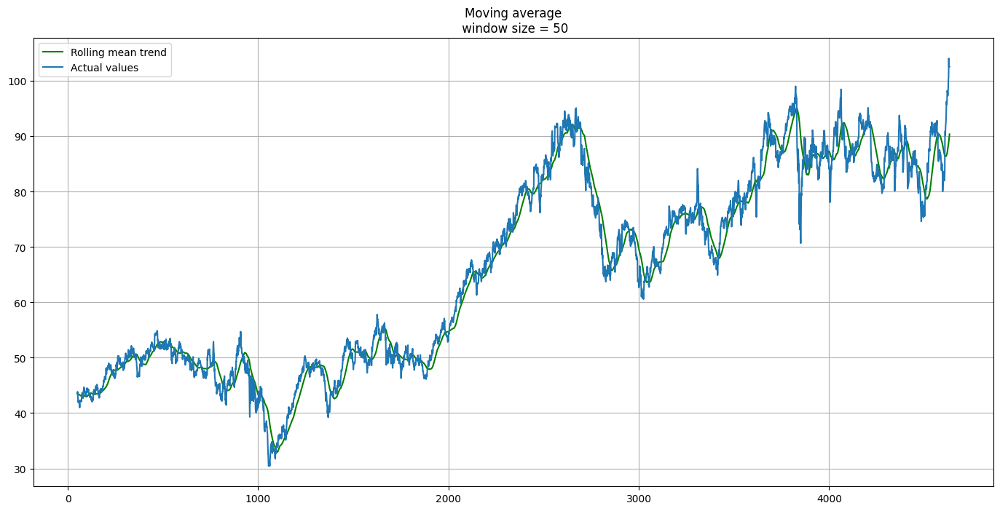

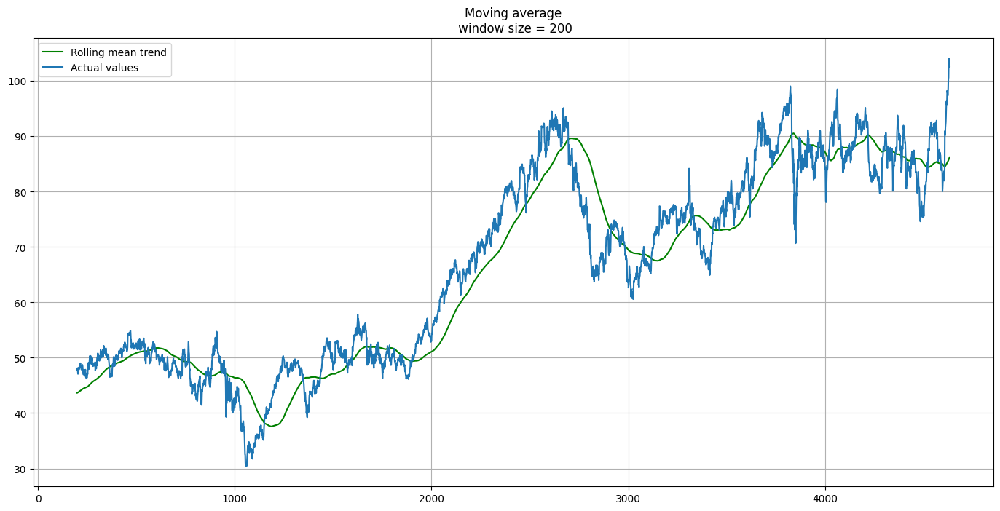

In [18]:
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window=window).mean()
    
    plt.figure(figsize=(17,8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')
    
    #Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
            
    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)

    
plot_moving_average(nvs.Close, 50)
plot_moving_average(nvs.Close, 200)

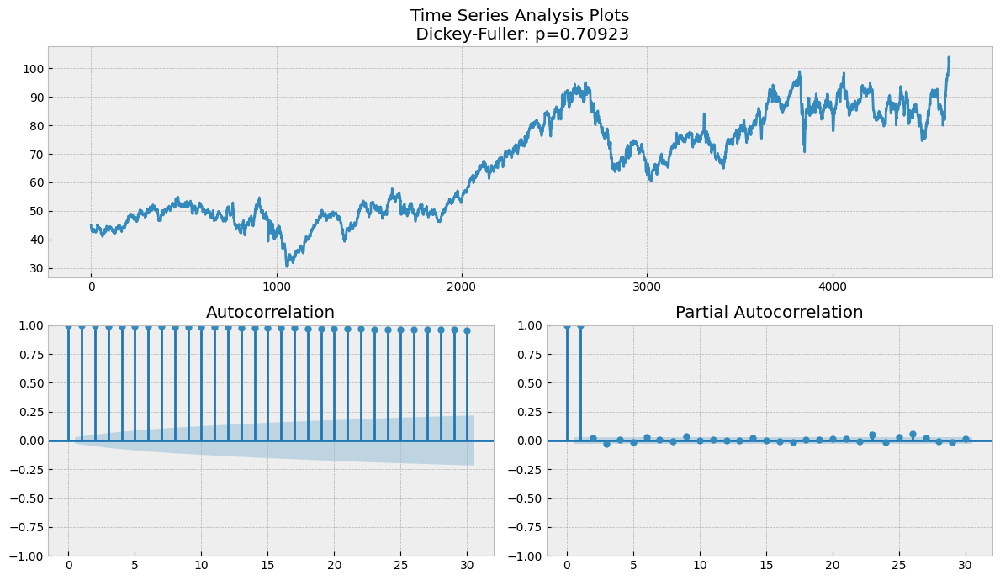

In [19]:
def tsplot(y, lags=None, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        
tsplot(nvs.Close, lags=30)

+ Relation between statements and price

In [20]:
def plot_returns_and_text(returns_df, transcripts_df):
    '''
    Plots the dates of a company's earning calls on top of a chart of the company's daily returns.

    Args:
        returns_df: A Pandas DataFrame containing a company's daily returns.
                    The dataframe must have 'date' and 'price' columns.
        transcripts_df: A Pandas DataFrame containing a company's history of earnings calls.
                        The dataframe must have 'date' and 'statement' columns.
    '''
    # Set the date column as the index
    returns_df.set_index('Date', inplace=True)
    transcripts_df.set_index('earning_call_date', inplace=True)
    
    # Plot the transcript events below the price, 10% offset from min price
    event_level = int(returns_df['Close'].min() * 0.9)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(22,8))
    ax.plot(returns_df.index, returns_df['Close'])
    for date in transcripts_df.index:
        ax.axvspan(date - pd.to_timedelta('1 days'), date + pd.to_timedelta('6 days'), color='green', alpha=0.15)
    fig.autofmt_xdate()
    ax.set_title('Analyzing the connection between earnings call events and price movement - Novartis')
    ax.set_ylabel('Daily return')


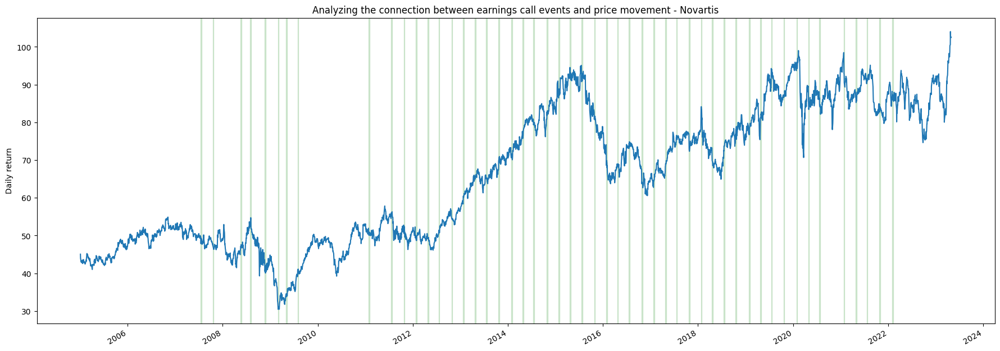

In [21]:
nvs_s = nvs.copy()
nvs_sp = nvs_s.filter(['Date','Close'], axis=1)
nvs_sp['Date'] =  pd.to_datetime(nvs_sp['Date'], infer_datetime_format=True)


nvs_e = nvs.copy()
nvs_ec = nvs_e.filter(['earning_call_date','content'], axis=1)
nvs_ec['earning_call_date'] =  pd.to_datetime(nvs_ec['earning_call_date'], infer_datetime_format=True)
nvs_ec = nvs_ec.dropna(subset=['content'])

plot_returns_and_text(nvs_sp, nvs_ec)

## Saving final data frame

In [25]:
# Clean variables
stock_prices = stock_prices.drop(['Open','High','Low','Close','Instrument','symbol','quarter','year','eps_mean_report_ps'],axis = 1)


In [26]:
# Save dataframe
stock_prices.to_csv('../data/stock_prices_complete.csv')